# Objective

This notebook investigates the sphericity of amphoras from the Yassiada dataset.

# Contents

1. Volume vs. sphericity, observations
2. Diameter vs. sphericity, observations
3. Amphoras ranked by sphericity, observations
4. Amphoras displayed from least spherical to most spherical
    - Four views are displayed for each amphora to facilitate visual assessment of sphericity.
    - Command + F or ctrl + F to search for an amphora tag/label.

# Dataset

47 Yassiada amphoras comprise the dataset analyzed in this notebook.

Amphoras omitted because a large chunk is missing: 86-38, 86-45, W1, W70, Y52, and Y2

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import circularity_util
from matplotlib.lines import Line2D
from skimage.io import imread

In [19]:
colors = {'Spiral combed - main group': '#412100',
          'Spiral combed - main group - ring lip': 'xkcd:violet',
          'Spiral combed - fractional': 'xkcd:tan',
          'Spiral combed - massive neck, massive diagonal handles': 'xkcd:red',
          'Spiral combed - massive neck, massive vertical handles': 'xkcd:orange',
          'Spiral combed - outlier?': 'xkcd:green',
          'Wide band of combing/squared handles': 'xkcd:blue'}

In [20]:
def get_group(model):
    return list(group_df[group_df.label==model].group)[0]
def get_diameter(model):
    return list(group_df[group_df.label==model].diameter)[0]
def get_body_height(model):
    return list(group_df[group_df.label==model].body_height)[0]
def get_volume(model):
    return list(df[df.model==model].volume)[0]
def get_sphericity(model):
    return list(df[df.model==model].sphericity)[0]

In [21]:
df = pd.read_csv('sphericity_data.csv')
models = list(df.model)
group_df = pd.read_csv('group_cap_diam_bh.csv')

# Volume vs. Sphericity

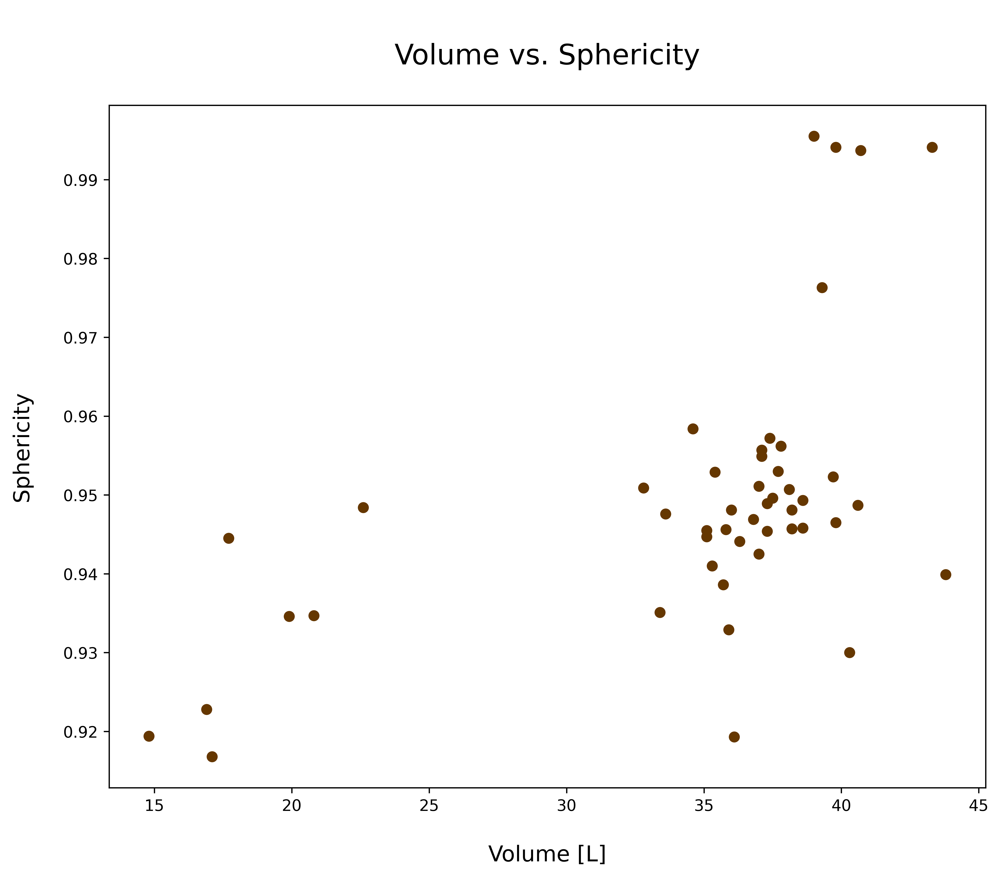

In [22]:
plt.figure(figsize=(10,8), dpi=600)
plt.scatter([x*10**-6 for x in list(df.volume)],
            list(df.sphericity), color='xkcd:brown')
plt.title('\nVolume vs. Sphericity\n', fontsize=18)
plt.xlabel('\nVolume [L]', fontsize=14)
plt.ylabel('Sphericity\n', fontsize=14)
plt.show()

# Volume vs. Sphericity, colored by group

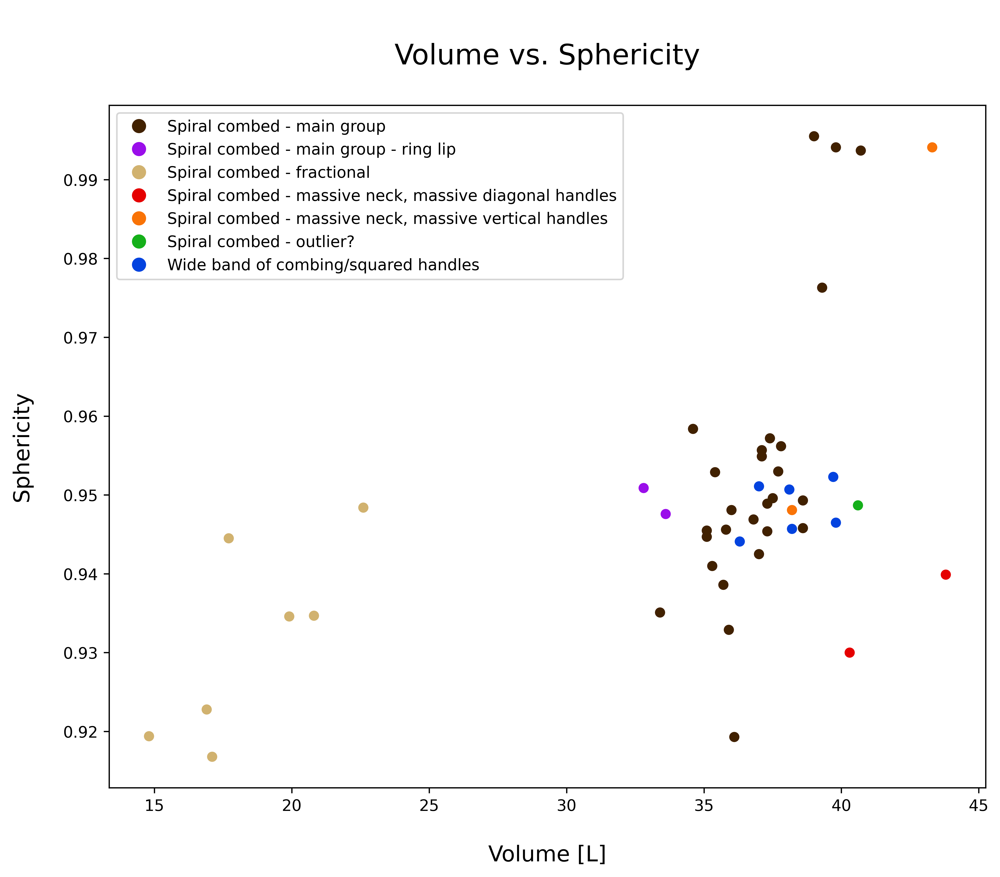

In [23]:
plt.figure(figsize=(10,8), dpi=600)
for model in models:
    plt.scatter(get_volume(model)*10**-6,
                get_sphericity(model),
                color=colors[get_group(model)],
                s=30)
handle_list = []
for label in colors:
    handle_list.append(Line2D([0],[0], marker='o', color='w',
                              markersize=10,
                              markerfacecolor=colors[label],
                              label=label))
plt.legend(handles=handle_list, loc='upper left')
plt.title('\nVolume vs. Sphericity\n', fontsize=18)
plt.xlabel('\nVolume [L]', fontsize=14)
plt.ylabel('Sphericity\n', fontsize=14)
plt.show()

### Observations

Amphoras tend to cluster in groups along axes of volume and sphericity.
- Most of the main group amphoras have a sphericity between about 0.92 and 0.96 and a volume between about 35 L and 40 L. 
- The fractional amphoras, which are a lot smaller, are less spherical. Indeed, by visual inspection (see amphoras shown at the bottom of this notebook) they are more short and squat.
- The wideband amphoras are also close in sphericity (about 0.945 to 0.955) and volume (about 36 L to 40 L).
- The amphoras with massive necks and massive diagonal handles both have lower sphericity and higher volume.
    - Perhaps attaching such massive necks and handles caused more deformation to the amphora bodies?
    -  Looking at the reference images at the bottom of this notebook (command + F or ctrl + F "massive diagonal handles"), their shoulders do look like they've been pushed down.

# Diameter vs. Sphericity

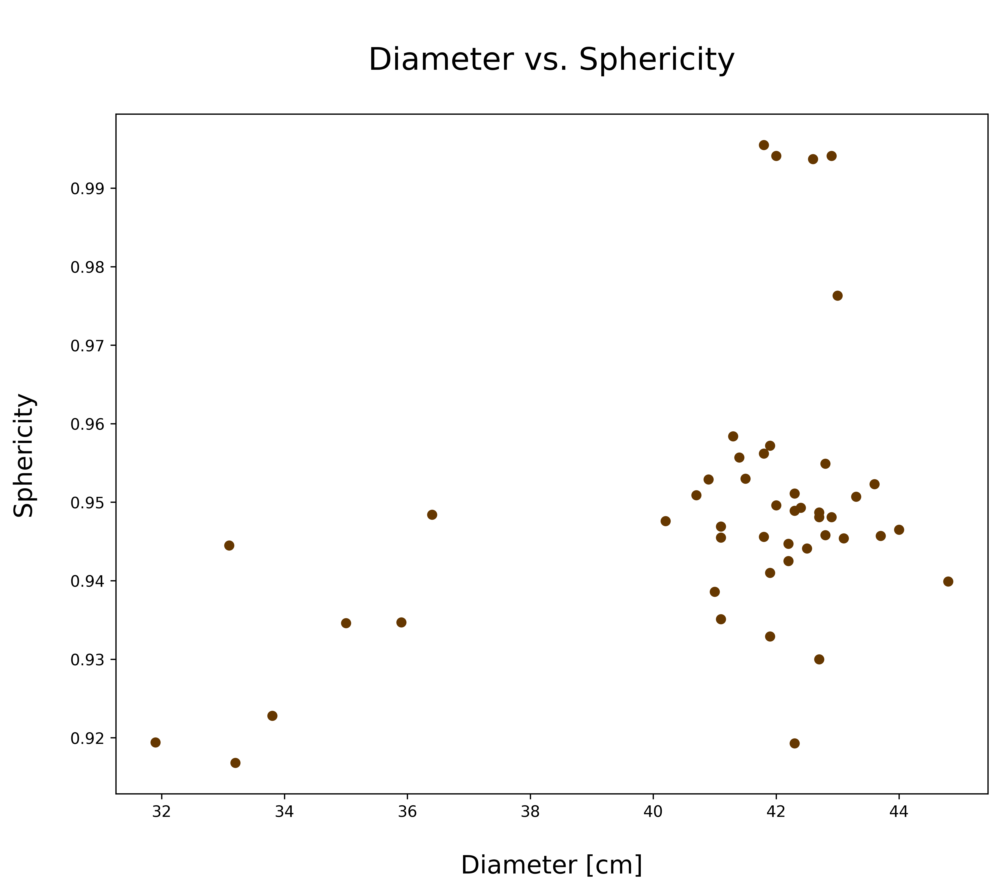

In [24]:
plt.figure(figsize=(10,8), dpi=600)

for model in models:
    plt.scatter(get_diameter(model),
                get_sphericity(model),
                color='xkcd:brown',
                s=30)
plt.title('\nDiameter vs. Sphericity\n', fontsize=20)
plt.xlabel('\nDiameter [cm]', fontsize=16)
plt.ylabel('Sphericity\n', fontsize=16)
plt.show()

# Diameter vs. Sphericity, colored by group

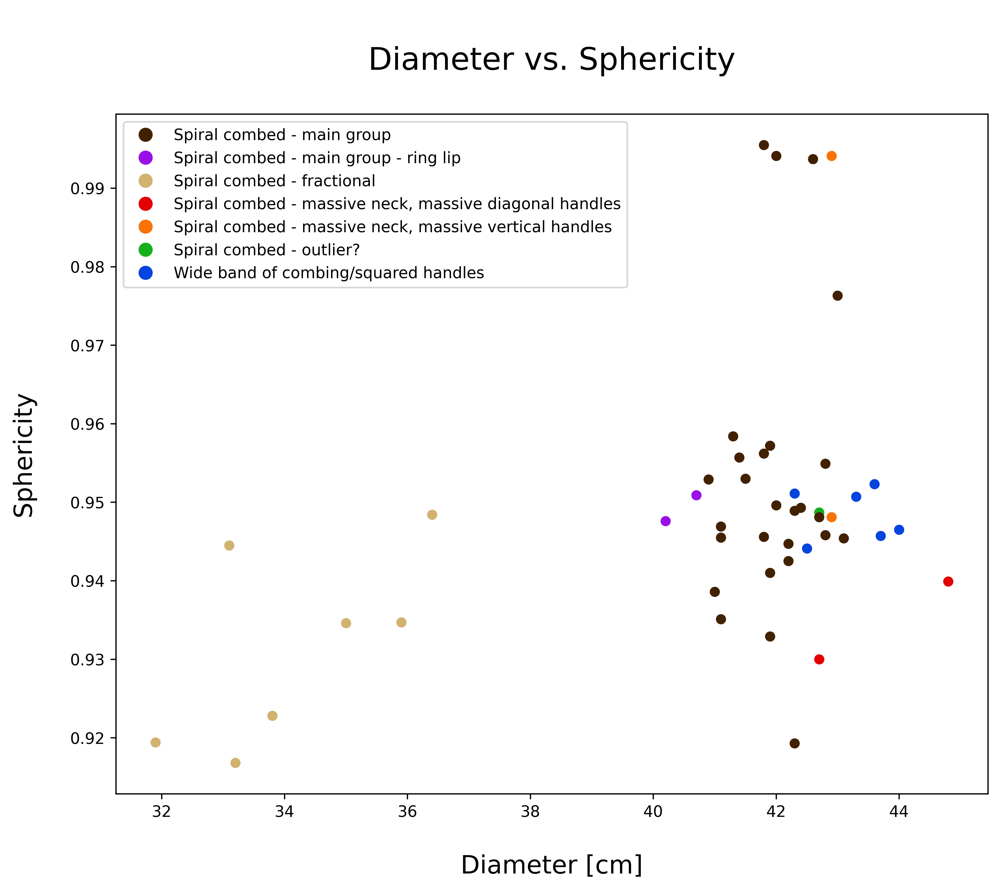

In [25]:
plt.figure(figsize=(10,8), dpi=600)

for model in models:
    plt.scatter(get_diameter(model),
                get_sphericity(model),
                color=colors[get_group(model)],
                s=30)
handle_list = []
for label in colors:
    handle_list.append(Line2D([0],[0], marker='o', color='w',
                              markersize=10,
                              markerfacecolor=colors[label],
                              label=label))
plt.legend(handles=handle_list, loc='upper left')

plt.title('\nDiameter vs. Sphericity\n', fontsize=20)
plt.xlabel('\nDiameter [cm]', fontsize=16)
plt.ylabel('Sphericity\n', fontsize=16)
plt.show()

### Observations

Amphoras tend to cluster in groups along axes of diameter and sphericity in the same way that they cluster along axes of volume and sphericity.

- Most of the main group amphoras have a sphericity between about 0.92 and 0.96 and a diamter between about 41 cm and 43 cm. 
- The fractional amphoras, which are a lot smaller, are less spherical. Indeed, by visual inspection (see amphoras shown at the bottom of this notebook) they are more short and squat.
- The wideband amphoras are also close in sphericity (about 0.945 to 0.955) and diameter (about 42 L to 44 cm).
- The amphoras with massive necks and massive diagonal handles both have lower sphericity and higher volume.
    - Perhaps attaching such massive necks and handles caused more deformation to the amphora bodies?
    -  Looking at the reference images at the bottom of this notebook (command + F or ctrl + F "massive diagonal handles"), their shoulders do look like they've been pushed down.

# Diameter / Body Height vs. Sphericity

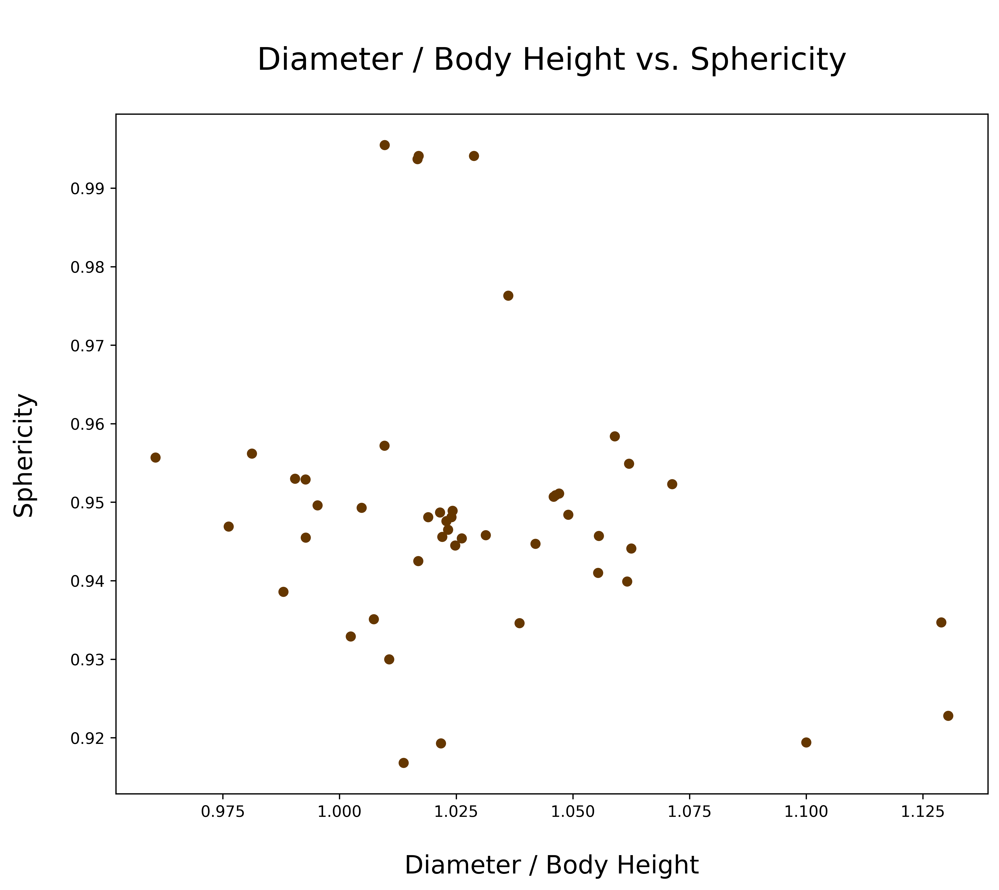

In [26]:
plt.figure(figsize=(10,8), dpi=600)

for model in models:
    plt.scatter(get_diameter(model)/get_body_height(model),
                get_sphericity(model),
                color='xkcd:brown',
                s=30)
plt.title('\nDiameter / Body Height vs. Sphericity\n', fontsize=20)
plt.xlabel('\nDiameter / Body Height', fontsize=16)
plt.ylabel('Sphericity\n', fontsize=16)
plt.show()

# Diameter / Body Height vs. Sphericity, colored by group

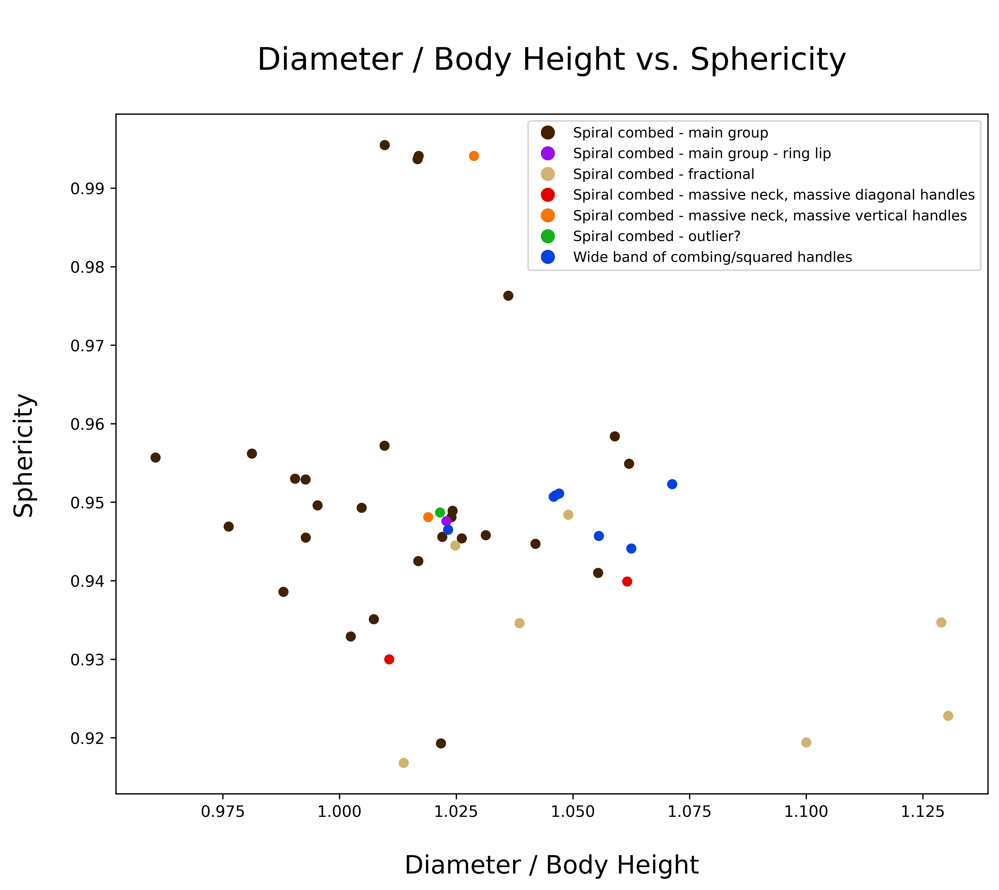

In [30]:
plt.figure(figsize=(10,8), dpi=600)

for model in models:
    plt.scatter(get_diameter(model)/get_body_height(model),
                get_sphericity(model),
                color=colors[get_group(model)],
                s=30)
handle_list = []
for label in colors:
    handle_list.append(Line2D([0],[0], marker='o', color='w',
                              markersize=10,
                              markerfacecolor=colors[label],
                              label=label))
plt.legend(handles=handle_list, loc='upper right', fontsize=9)

plt.title('\nDiameter / Body Height vs. Sphericity\n', fontsize=20)
plt.xlabel('\nDiameter / Body Height', fontsize=16)
plt.ylabel('Sphericity\n', fontsize=16)
plt.show()

# Amphoras ranked by sphericity

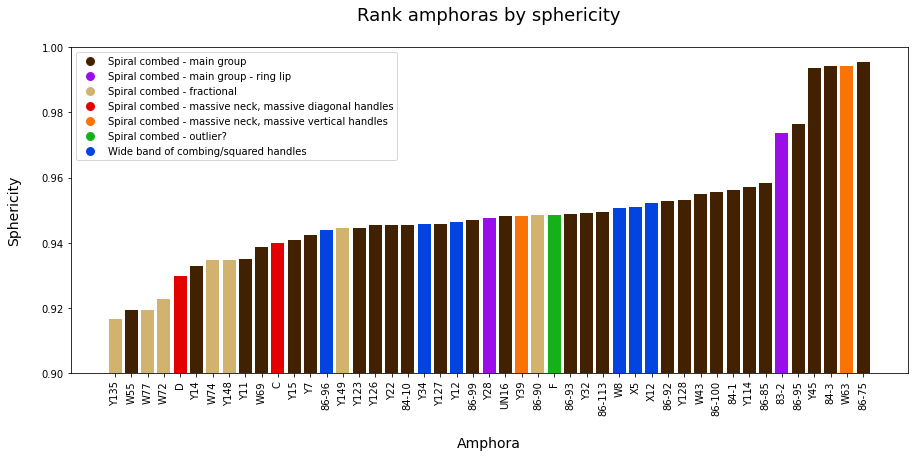

In [112]:
sphericity_list, color_list = [], []
for model in models:
    sphericity_list.append(get_sphericity(model))
    color_list.append(colors[get_group(model)])
sphericities_sorted = sorted(sphericity_list)
colors_sorted = [x for _,x in sorted(zip(sphericity_list, color_list))]
models_sorted = [x for _,x in sorted(zip(sphericity_list, models))]

fig, ax = plt.subplots(figsize = (15, 6))
x_pos = np.arange(len(sphericities_sorted))
ax.bar(x_pos, sphericities_sorted, color=colors_sorted)
ax.set_xticks(x_pos)
ax.set_xticklabels(models_sorted)
plt.xlabel('\nAmphora', fontsize=14)
plt.ylabel('Sphericity\n', fontsize=14)
plt.title('Rank amphoras by sphericity\n', fontsize=18)
plt.xticks(rotation='vertical')
plt.ylim(0.9, 1)

handle_list = []
for label in color_dict:
    handle_list.append(Line2D([0],[0], marker='o', color='w', markersize=10,
                              markerfacecolor=color_dict[label], label=label))
plt.legend(handles=handle_list, loc='upper left')

plt.show()

### Observations

- Very little sphericity difference separates most of the amphoras – from W69 (sphericity ~ 0.94) to 86-85 (sphericity ~ 0.96).
- The fractional amphoras tend to be less spherical.
- The wide band amphoras are all close in sphericity.
- The amphoras with massive necks and massive diagonal handles are less spherical.
- I don't see any other strong patterns.

# Amphoras displayed from least spherical to most spherical

Four views are displayed for each amphora to facilitate visual assessment of sphericity. Command + F or ctrl + F to search for an amphora tag/label.



Model:			Y135
Group:			Spiral combed - fractional
Sphericity:		0.92


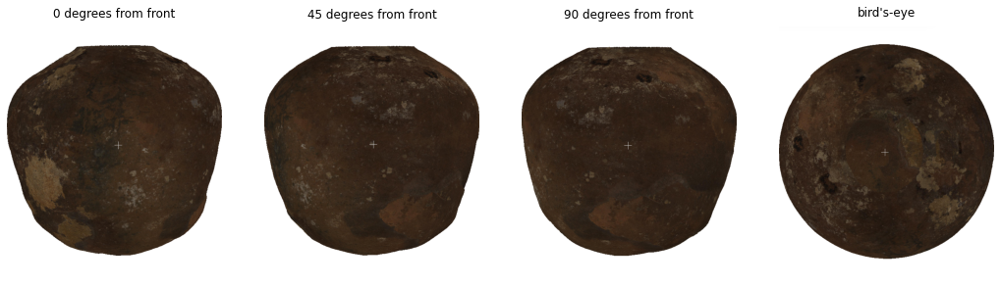



Model:			W55
Group:			Spiral combed - main group
Sphericity:		0.92


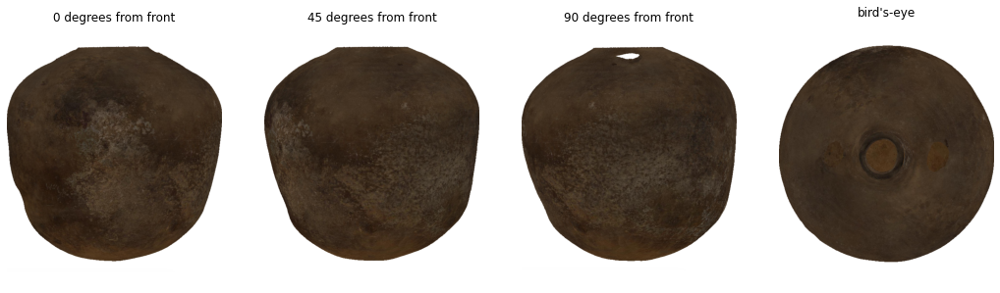



Model:			W77
Group:			Spiral combed - fractional
Sphericity:		0.92


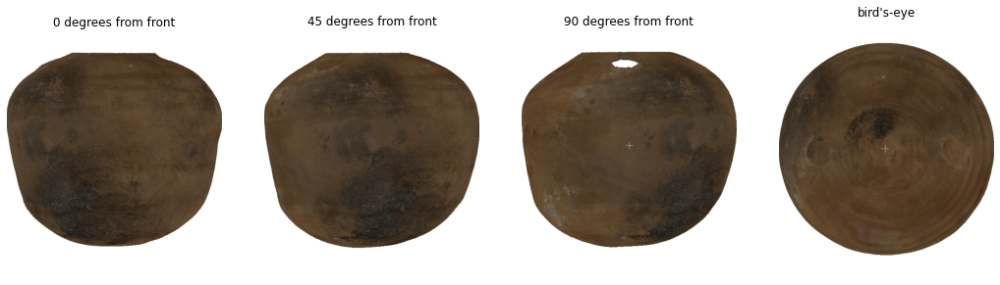



Model:			W72
Group:			Spiral combed - fractional
Sphericity:		0.92


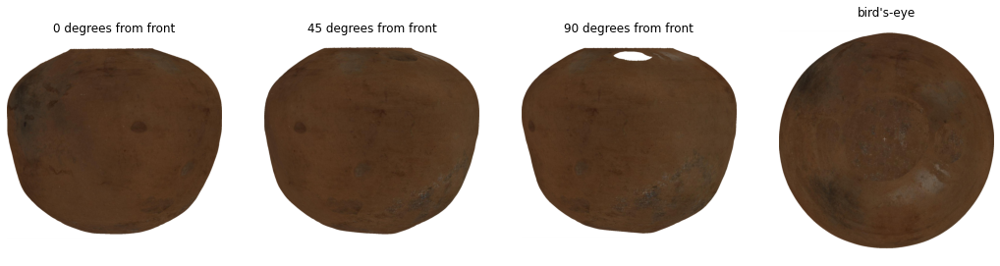



Model:			D
Group:			Spiral combed - massive neck, massive diagonal handles
Sphericity:		0.93


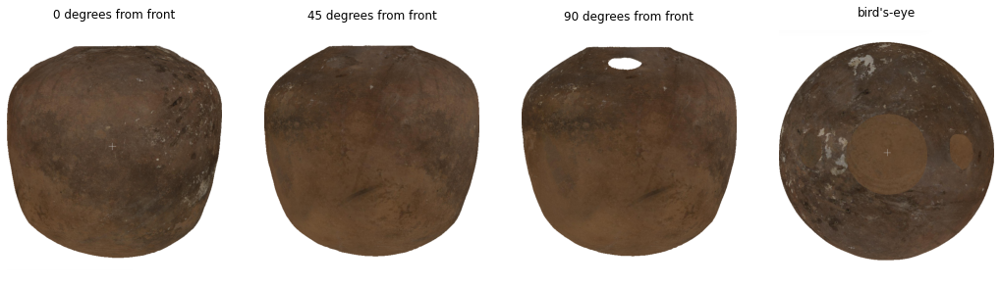



Model:			Y14
Group:			Spiral combed - main group
Sphericity:		0.93


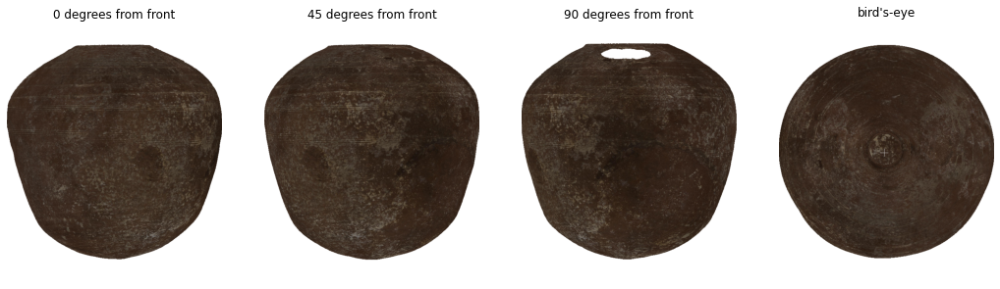



Model:			W74
Group:			Spiral combed - fractional
Sphericity:		0.93


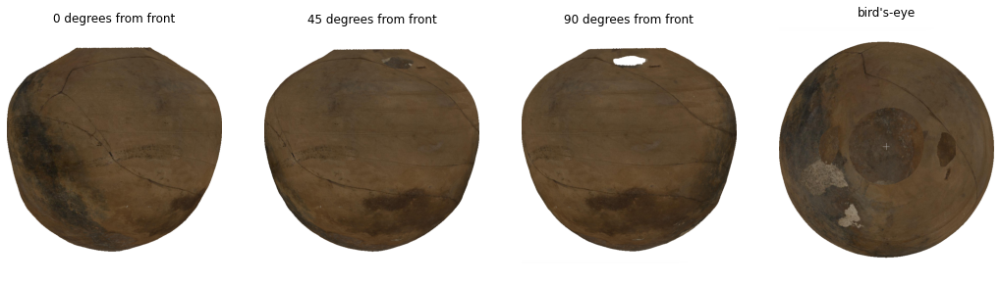



Model:			Y148
Group:			Spiral combed - fractional
Sphericity:		0.93


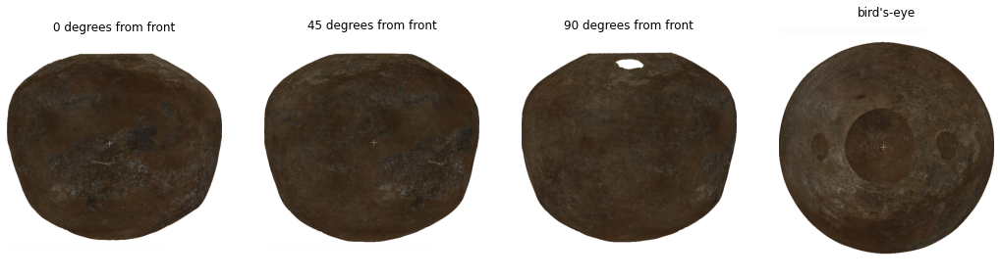



Model:			Y11
Group:			Spiral combed - main group
Sphericity:		0.94


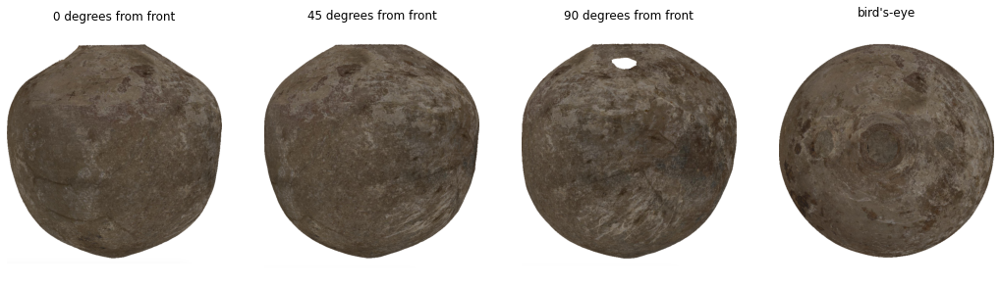



Model:			W69
Group:			Spiral combed - main group
Sphericity:		0.94


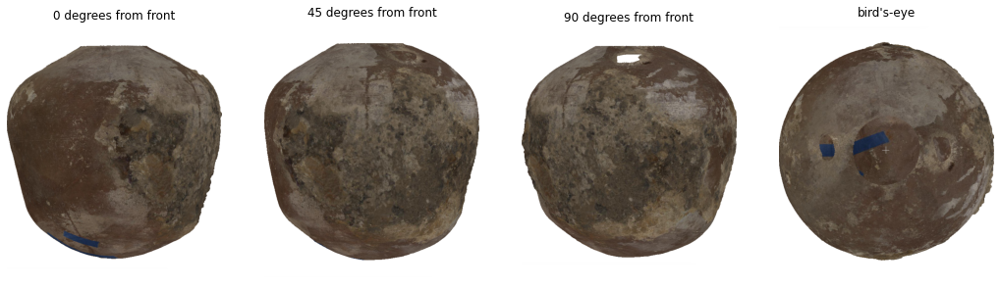



Model:			C
Group:			Spiral combed - massive neck, massive diagonal handles
Sphericity:		0.94


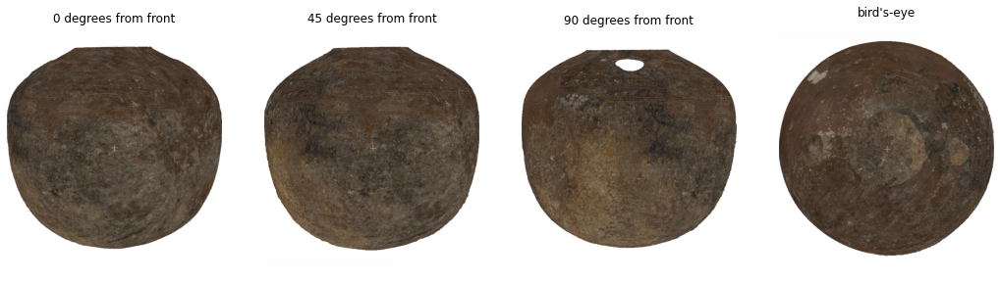



Model:			Y15
Group:			Spiral combed - main group
Sphericity:		0.94


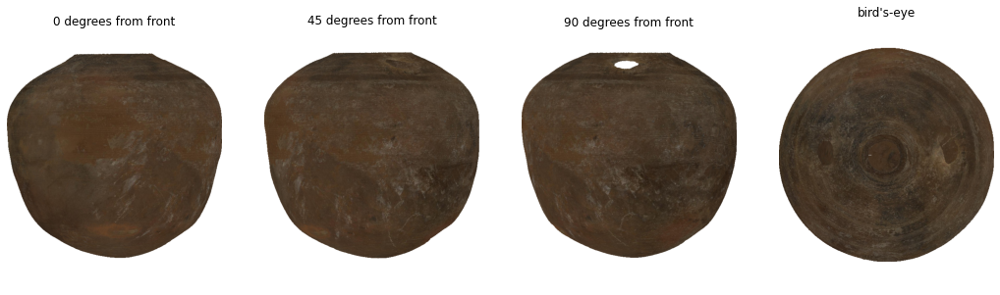



Model:			Y7
Group:			Spiral combed - main group
Sphericity:		0.94


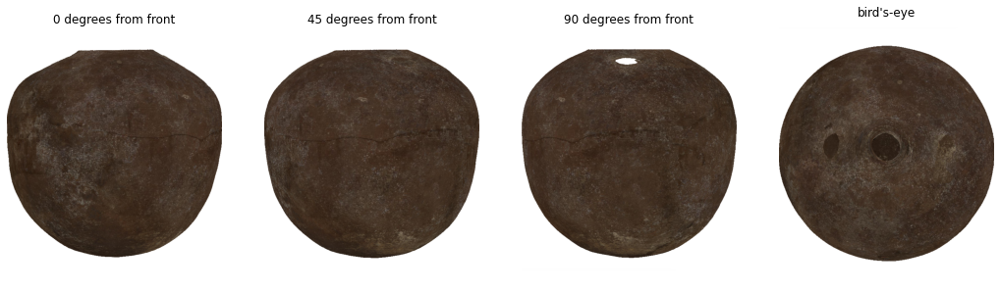



Model:			86-96
Group:			Wide band of combing/squared handles
Sphericity:		0.94


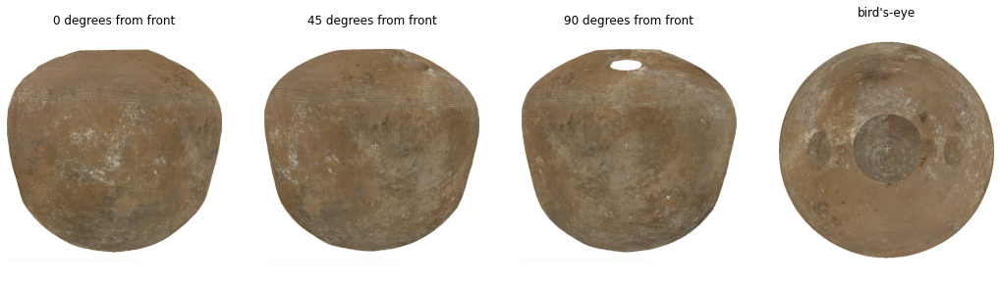



Model:			Y149
Group:			Spiral combed - fractional
Sphericity:		0.94


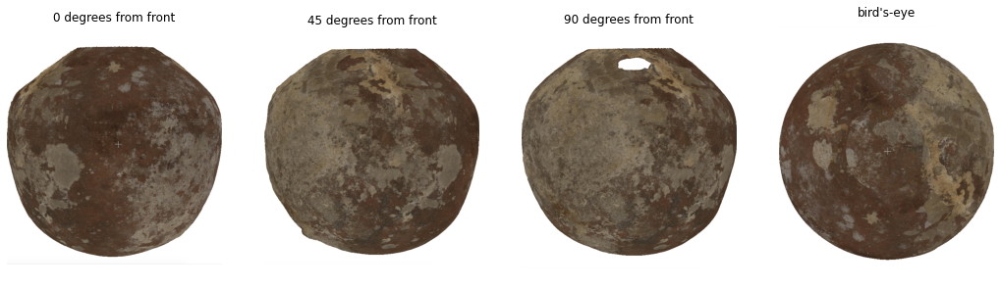



Model:			Y123
Group:			Spiral combed - main group
Sphericity:		0.94


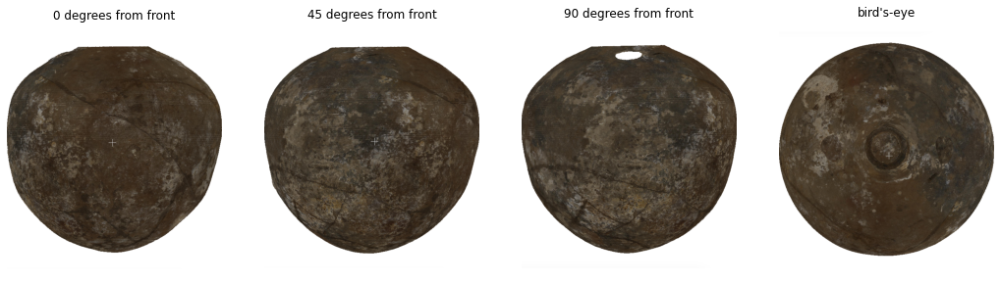



Model:			Y126
Group:			Spiral combed - main group
Sphericity:		0.95


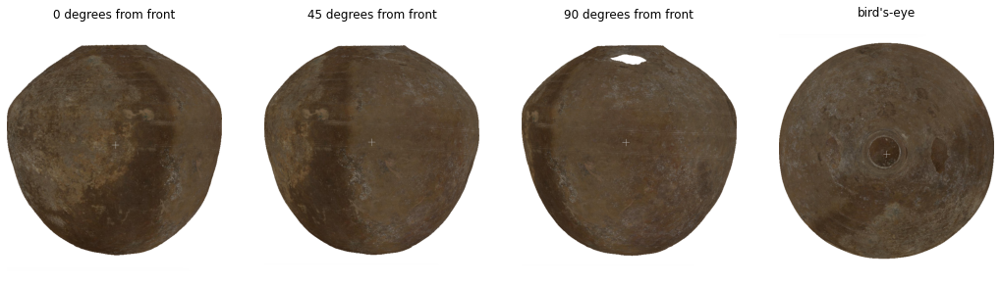



Model:			Y22
Group:			Spiral combed - main group
Sphericity:		0.95


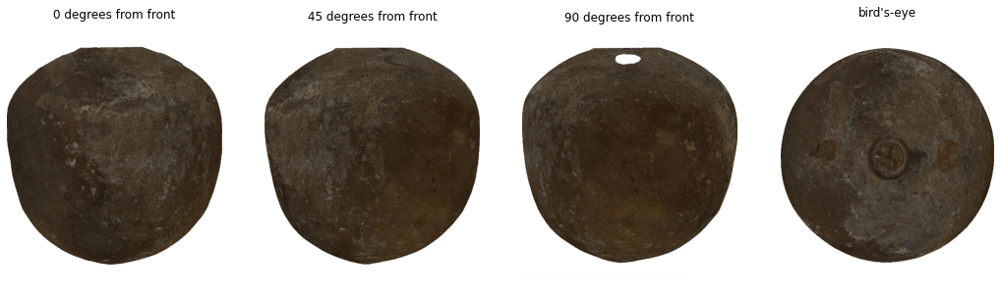



Model:			84-10
Group:			Spiral combed - main group
Sphericity:		0.95


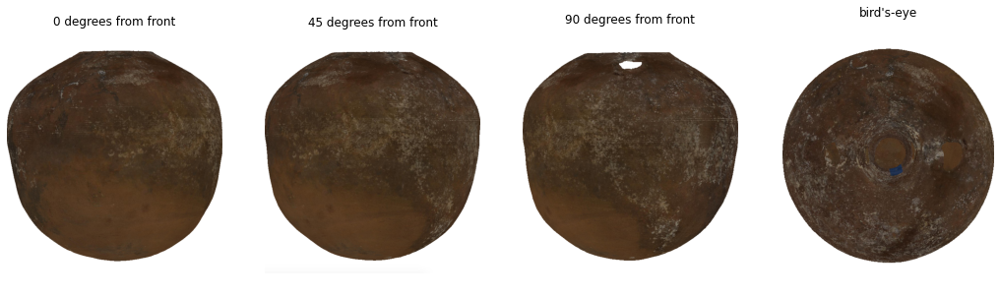



Model:			Y34
Group:			Wide band of combing/squared handles
Sphericity:		0.95


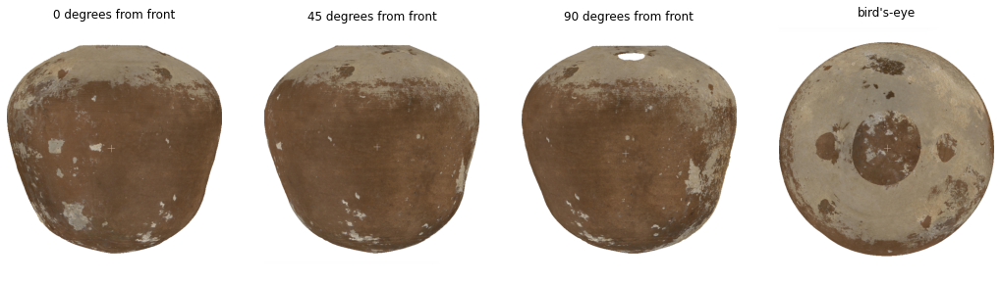



Model:			Y127
Group:			Spiral combed - main group
Sphericity:		0.95


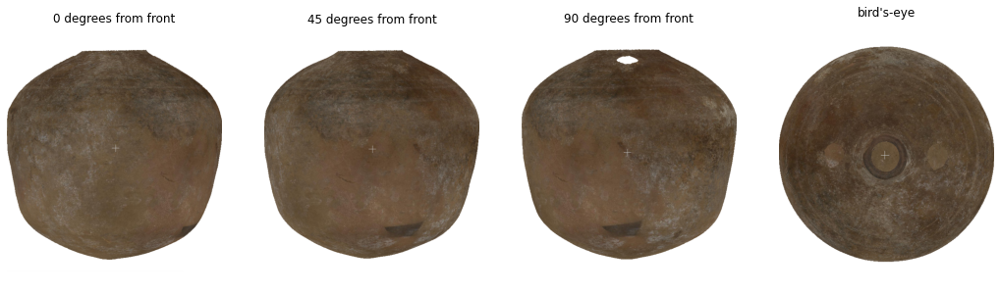



Model:			Y12
Group:			Wide band of combing/squared handles
Sphericity:		0.95


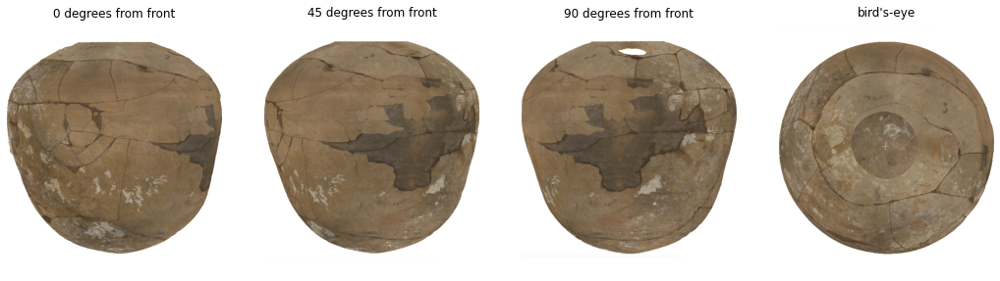



Model:			86-99
Group:			Spiral combed - main group
Sphericity:		0.95


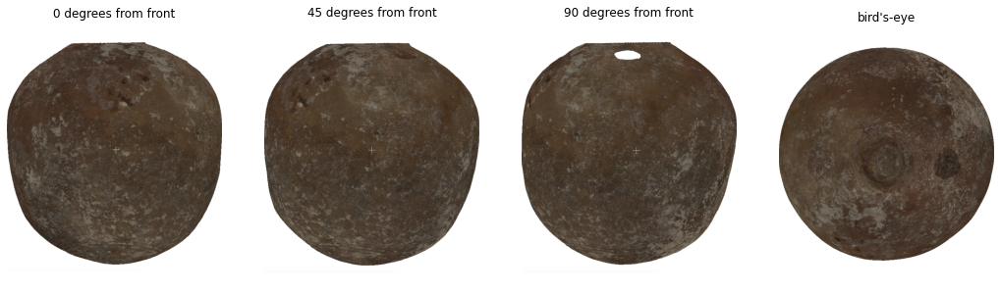



Model:			Y28
Group:			Spiral combed - main group - ring lip
Sphericity:		0.95


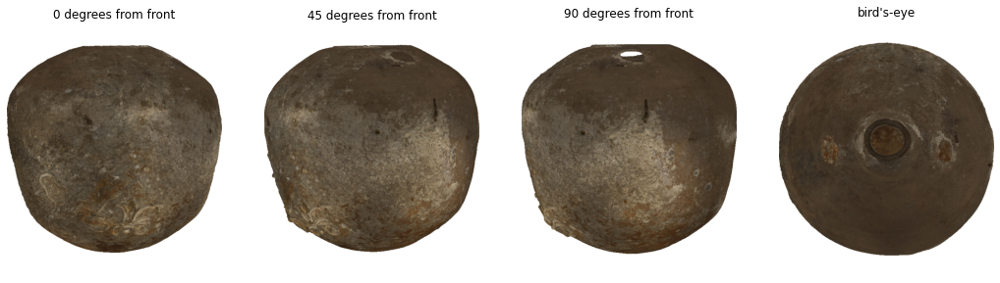



Model:			UN16
Group:			Spiral combed - main group
Sphericity:		0.95


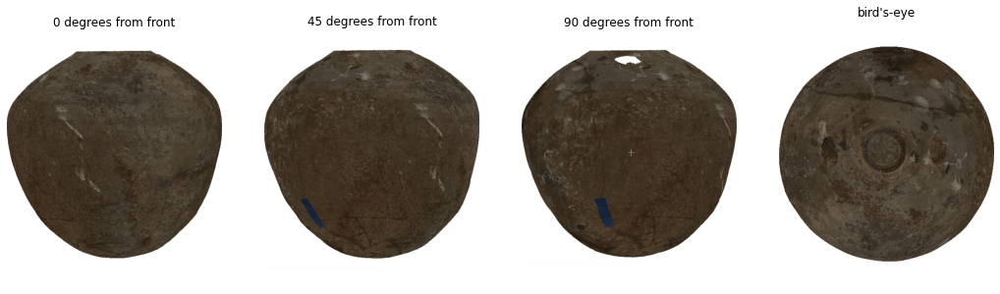



Model:			Y39
Group:			Spiral combed - massive neck, massive vertical handles
Sphericity:		0.95


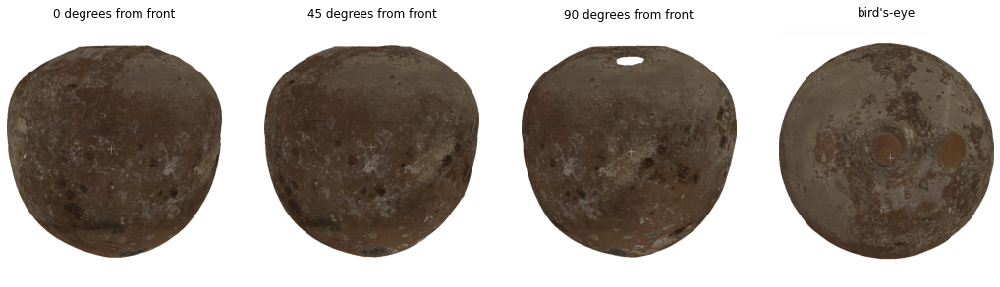



Model:			86-90
Group:			Spiral combed - fractional
Sphericity:		0.95


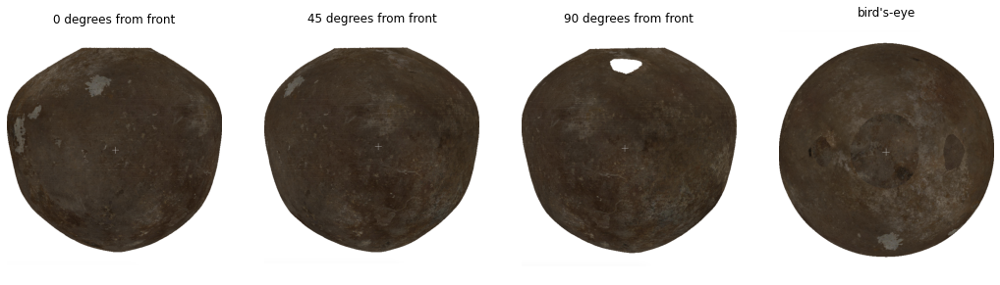



Model:			F
Group:			Spiral combed - outlier?
Sphericity:		0.95


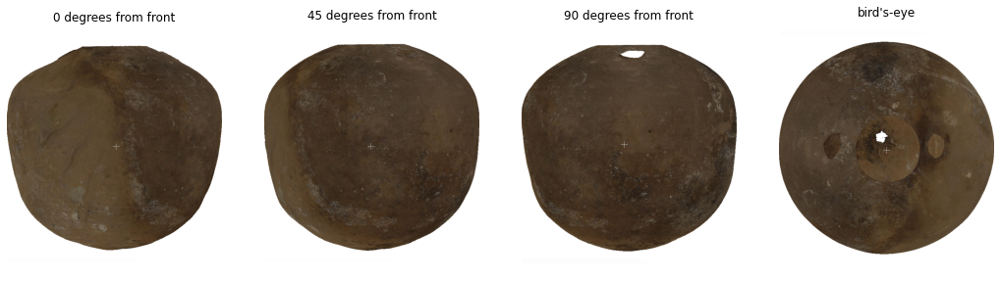



Model:			86-93
Group:			Spiral combed - main group
Sphericity:		0.95


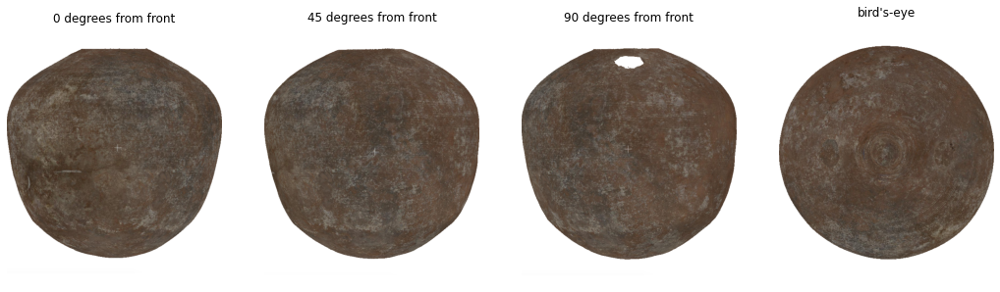



Model:			Y32
Group:			Spiral combed - main group
Sphericity:		0.95


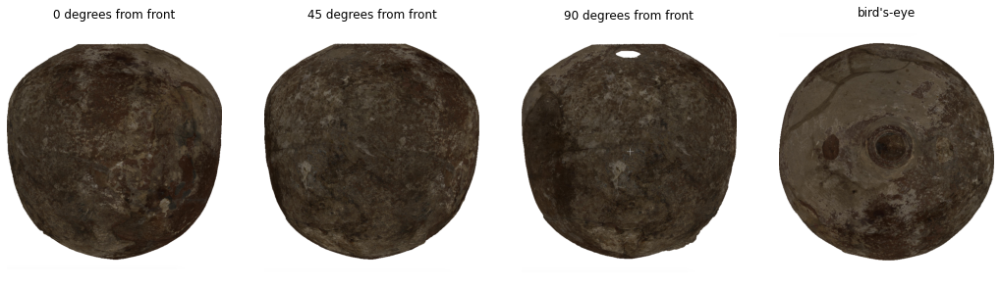



Model:			86-113
Group:			Spiral combed - main group
Sphericity:		0.95


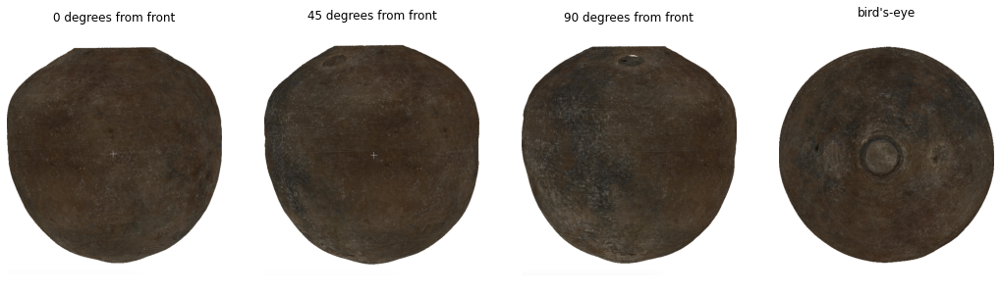



Model:			W8
Group:			Wide band of combing/squared handles
Sphericity:		0.95


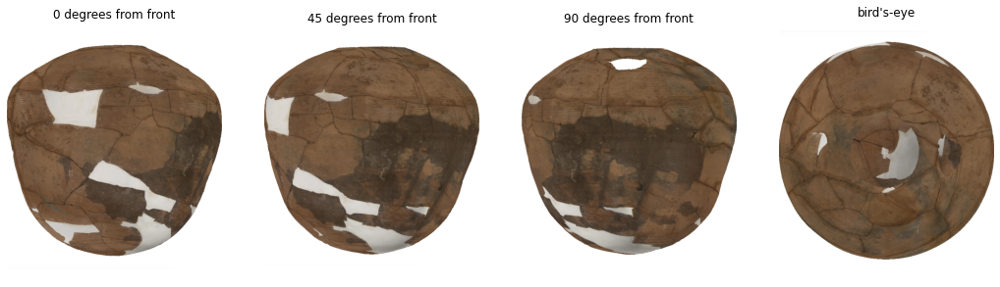



Model:			X5
Group:			Wide band of combing/squared handles
Sphericity:		0.95


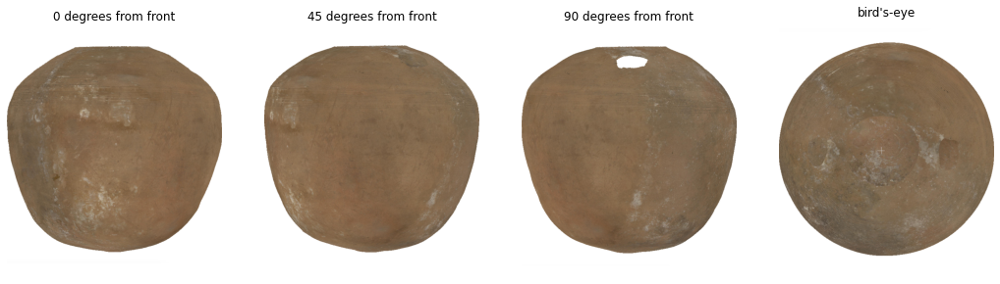



Model:			X12
Group:			Wide band of combing/squared handles
Sphericity:		0.95


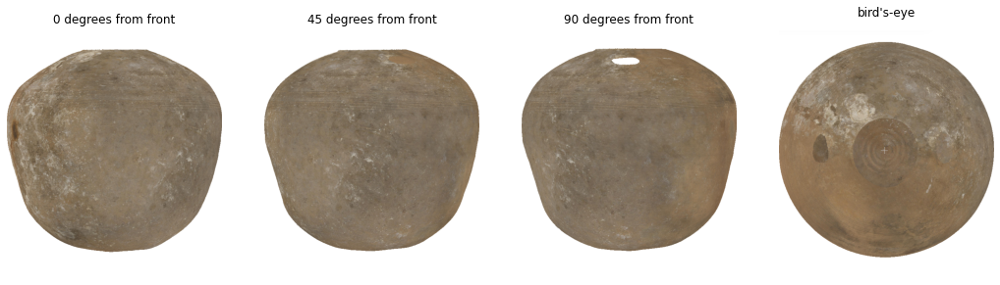



Model:			86-92
Group:			Spiral combed - main group
Sphericity:		0.95


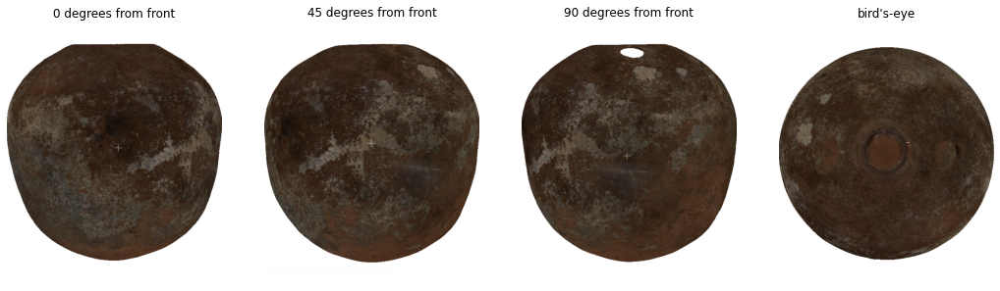



Model:			Y128
Group:			Spiral combed - main group
Sphericity:		0.95


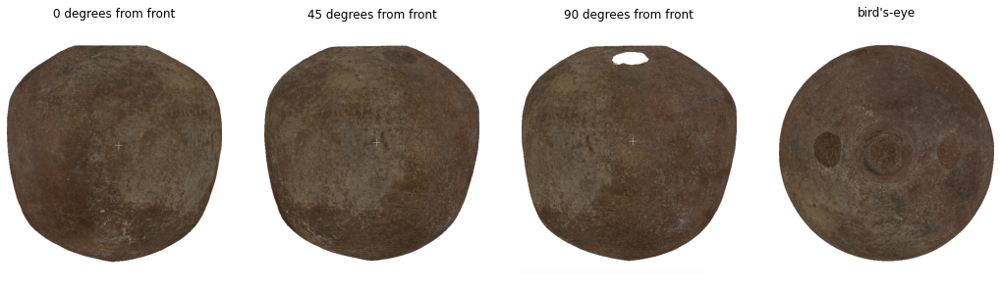



Model:			W43
Group:			Spiral combed - main group
Sphericity:		0.95


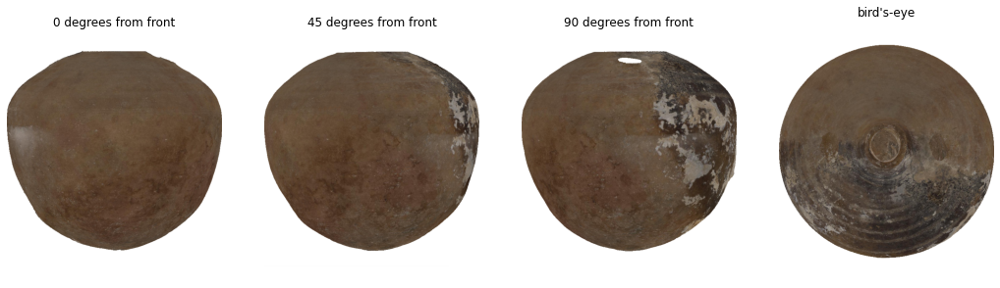



Model:			86-100
Group:			Spiral combed - main group
Sphericity:		0.96


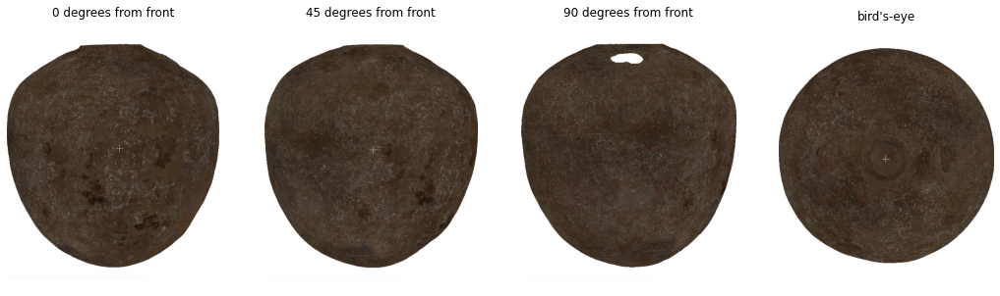



Model:			84-1
Group:			Spiral combed - main group
Sphericity:		0.96


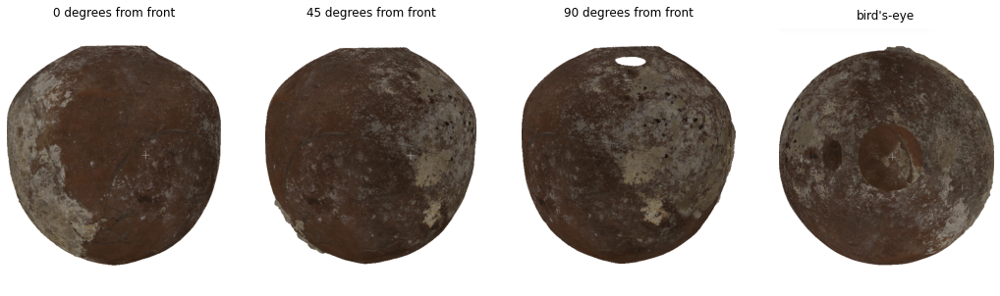



Model:			Y114
Group:			Spiral combed - main group
Sphericity:		0.96


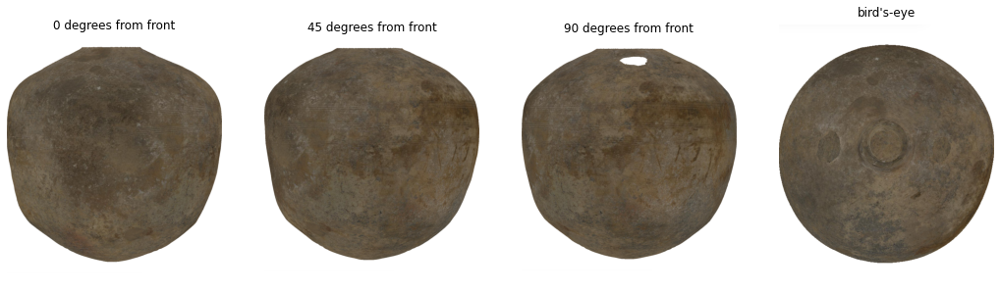



Model:			86-85
Group:			Spiral combed - main group
Sphericity:		0.96


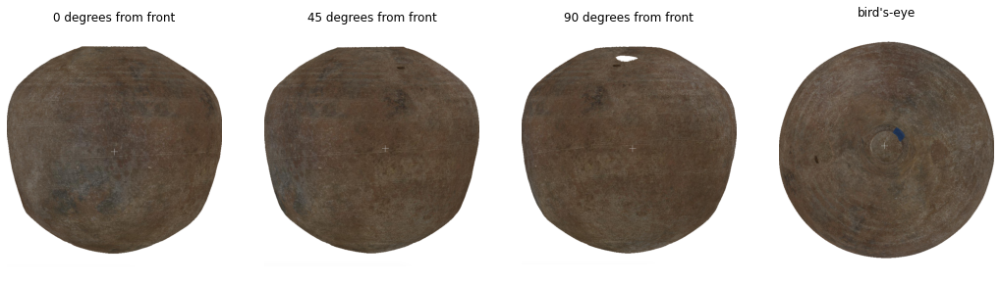



Model:			83-2
Group:			Spiral combed - main group - ring lip
Sphericity:		0.97


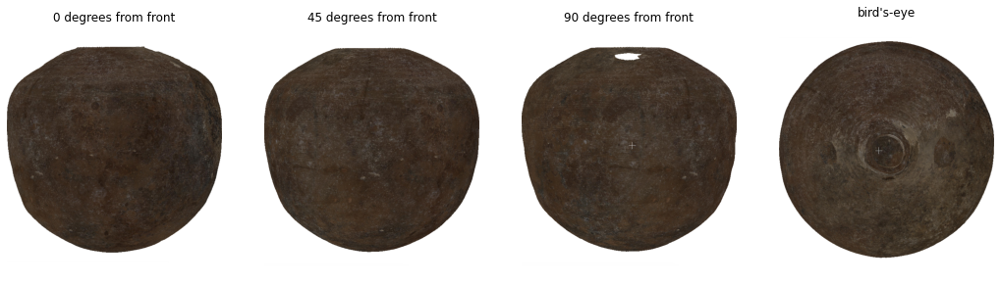



Model:			86-95
Group:			Spiral combed - main group
Sphericity:		0.98


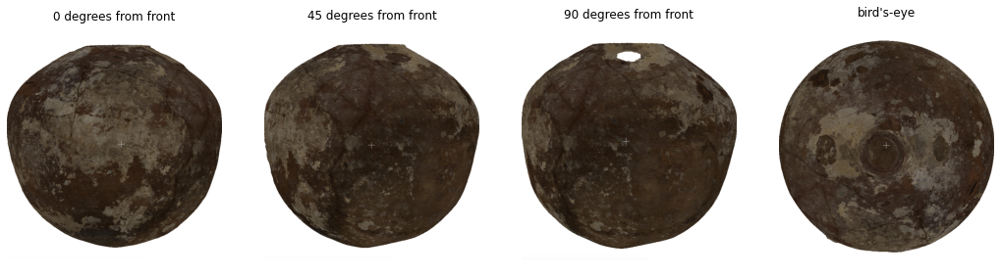



Model:			Y45
Group:			Spiral combed - main group
Sphericity:		0.99


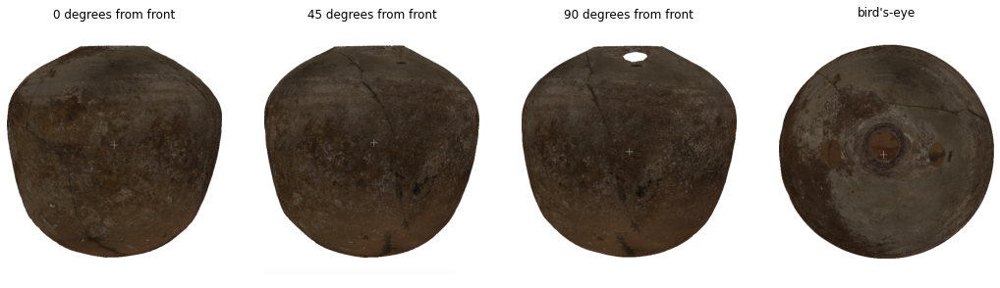



Model:			84-3
Group:			Spiral combed - main group
Sphericity:		0.99


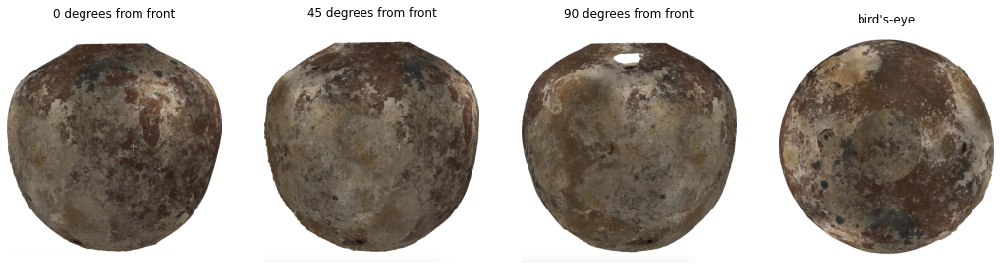



Model:			W63
Group:			Spiral combed - massive neck, massive vertical handles
Sphericity:		0.99


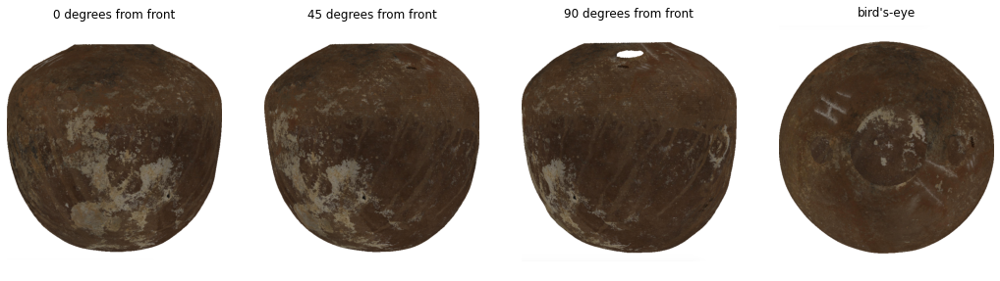



Model:			86-75
Group:			Spiral combed - main group
Sphericity:		1.0


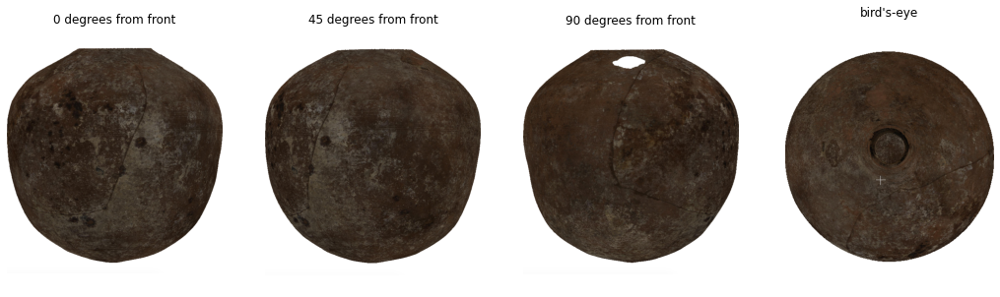

In [131]:
orientations = [0, 45, 90]
for i in range(len(models_sorted)):
    model = models_sorted[i]
    rank = len(models_sorted) - i
    print('\n\nModel:\t\t\t%s' % model)
    print('Group:\t\t\t%s' % get_group(model))
    sphericity = get_sphericity(model)
    print('Sphericity:\t\t%s' % str(round(sphericity,2)))
    
    fig, axes = plt.subplots(1, 4, figsize=(18, 5))

    for ind in range(3):
        im_path = '../circularity/vert/vert_%s_%s.png' % (model, orientations[ind])
        im = imread(im_path)
        bin_im = circularity_util.get_bin_im(im_path)

        xmin, xmax, ymin, ymax = circularity_util.get_shape_bounds(bin_im)
        
        axes[ind].imshow(np.asarray(im))
        axes[ind].set_xlim(xmin, xmax)
        axes[ind].set_ylim(ymin-60, ymax+60)
        axes[ind].set_ylim(axes[ind].get_ylim()[::-1])
        axes[ind].axis('off')
        axes[ind].set_title('%s degrees from front' % orientations[ind])

    im_path = '../circularity/birdseye/birdseye_%s.png' % model
    im = imread(im_path)
    bin_im = circularity_util.get_bin_im(im_path)

    xmin, xmax, ymin, ymax = circularity_util.get_shape_bounds(bin_im)
    
    axes[3].imshow(np.asarray(im))
    axes[3].set_xlim(xmin, xmax)
    axes[3].set_ylim(ymin-60, ymax+60)
    axes[3].axis('off')
    axes[3].set_title('bird\'s-eye')

    plt.show()